**Computational Imaging**
**Lab Session 1 : Basics of image processing**

First step: load an image (choose the astronaut or the lighthouse)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


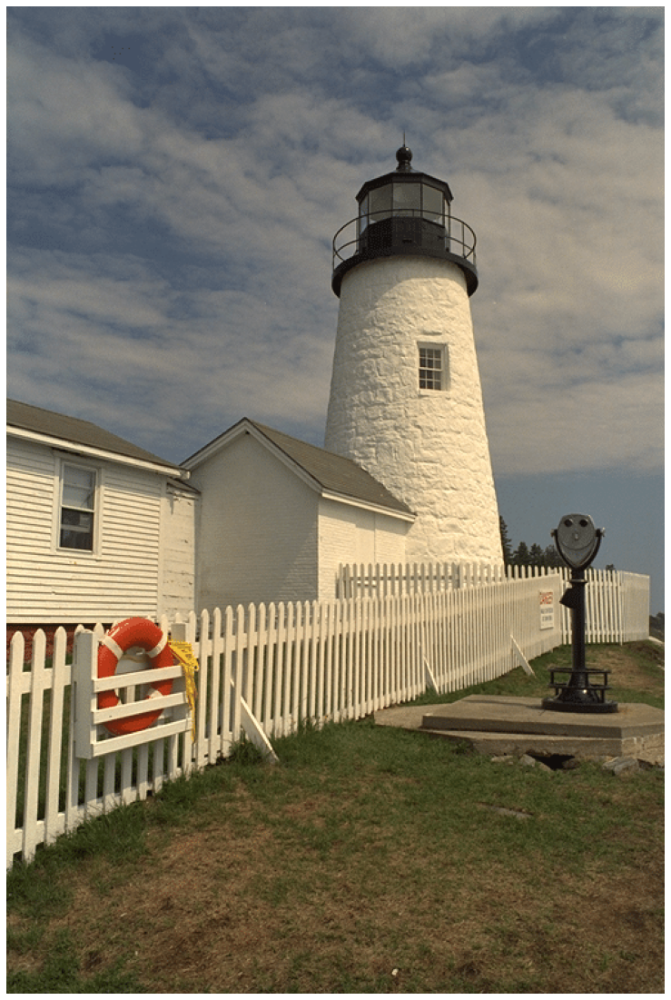

In [2]:
from skimage import data
from skimage.io import imread
import matplotlib.pyplot as plt
#%matplotlib notebook #does not work in colab but should work in notebook
import numpy as np

epsilon = 1e-6
#original = data.astronaut()

original = imread('Lighthouse.png')

original = (original +epsilon)/np.max(original) 
original=original[:,:,0:3]

plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(original,vmin=0,vmax=1)
plt.show()

**Question 1:** what is the range of the intensity values?

In [3]:
print(np.min(original))
print(np.max(original))
print("range=",np.max(original)-np.min(original))

0.03921569019607843
1.0000000039215686
range= 0.9607843137254902


An image can be modeled as a function $f$ such as $f$:  $\Omega \mapsto \mathbb{R}^d$.

**Question 2:** what is the image domain $\Omega$? What is the value of $d$?

In [4]:
np.shape(original)

#Omega= 768*512 
#d=3

#The image is a function that transforms coordinates into an intensity value in 3 dimensions


(768, 512, 3)

**Simulation of RAW images (applying a reverse Bayer filter)**

In [5]:
#Simulating Reverse Bayer Filter
red = original[:,:,0]
green = original[:,:,1]
blue = original[:,:,2]

bayer_red = np.zeros(red.shape)
bayer_red[1::2,1::2] = red[1::2,1::2]

bayer_blue = np.zeros(blue.shape)
bayer_blue[::2,::2] = blue[::2,::2]

bayer_green = np.zeros(green.shape)
bayer_green[1::2,::2] = green[1::2,::2]
bayer_green[::2,1::2] = green[::2,1::2]

**Question 3:** Check the values of the simulated Bayer images.

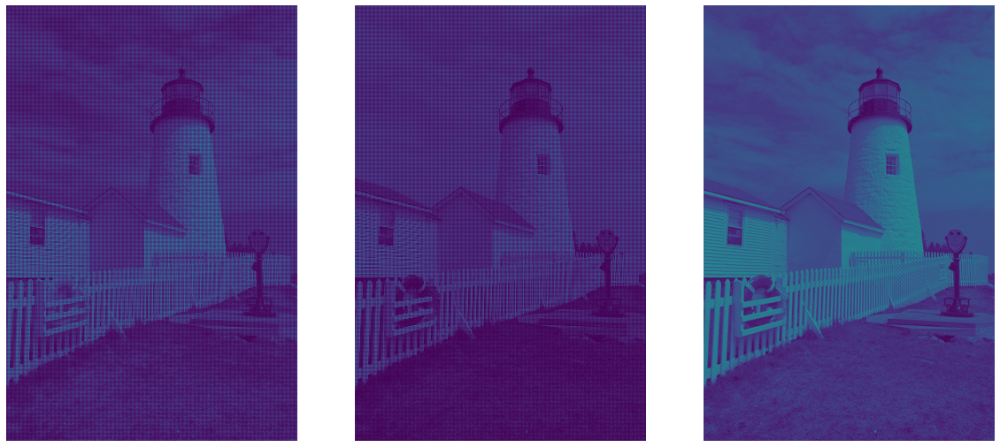

In [6]:
# Lista de imágenes
imagenes = [bayer_red, bayer_blue, bayer_green]

# Crear la figura y los subplots
fig, axes = plt.subplots(1, len(imagenes), figsize=(20, 20))

# Configurar las propiedades de los subplots
for ax in axes:
    ax.axis('off')

# Mostrar cada imagen en un subplot diferente
for ax, imagen in zip(axes, imagenes):
    ax.imshow(imagen, vmin=0, vmax=1)

# Mostrar los subplots
plt.show()

**Question 4:** Reconstruct an RGB image from the 3 Bayer images and visualize it.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


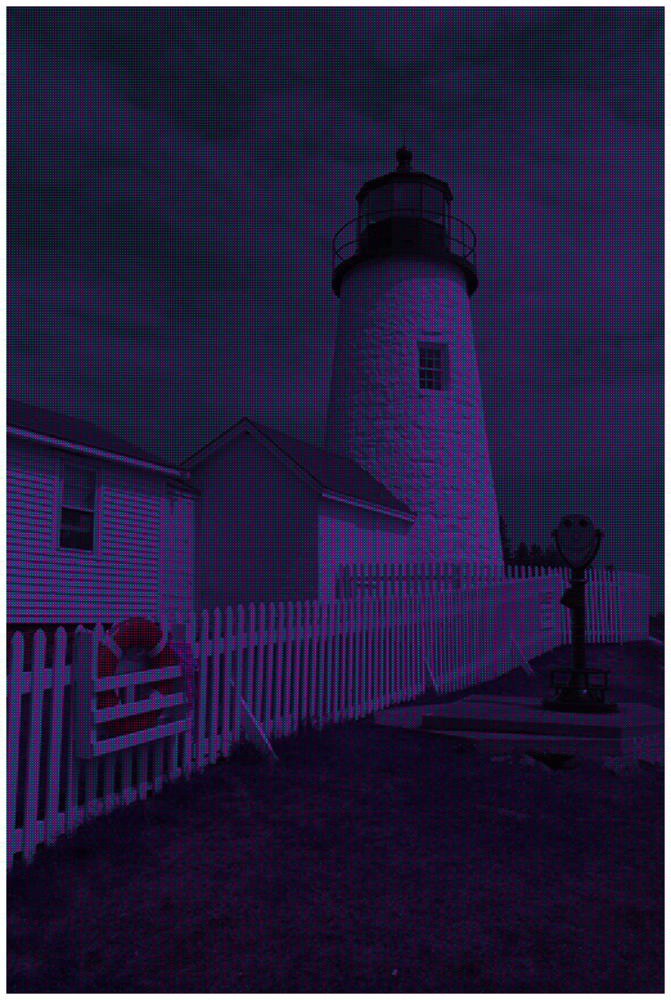

In [7]:
RGB_image=[bayer_red, bayer_blue, bayer_green]
RGB_image=np.transpose(RGB_image, (1, 2, 0))

plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(RGB_image,vmin=0,vmax=1)
plt.show()

**Question 5 :** Reconstruct the RGB image using interpolation methods on the spatial domain $\Omega$ (using the [griddata function from scipy](http://lagrange.univ-lyon1.fr/docs/scipy/0.17.1/generated/scipy.interpolate.griddata.html)).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


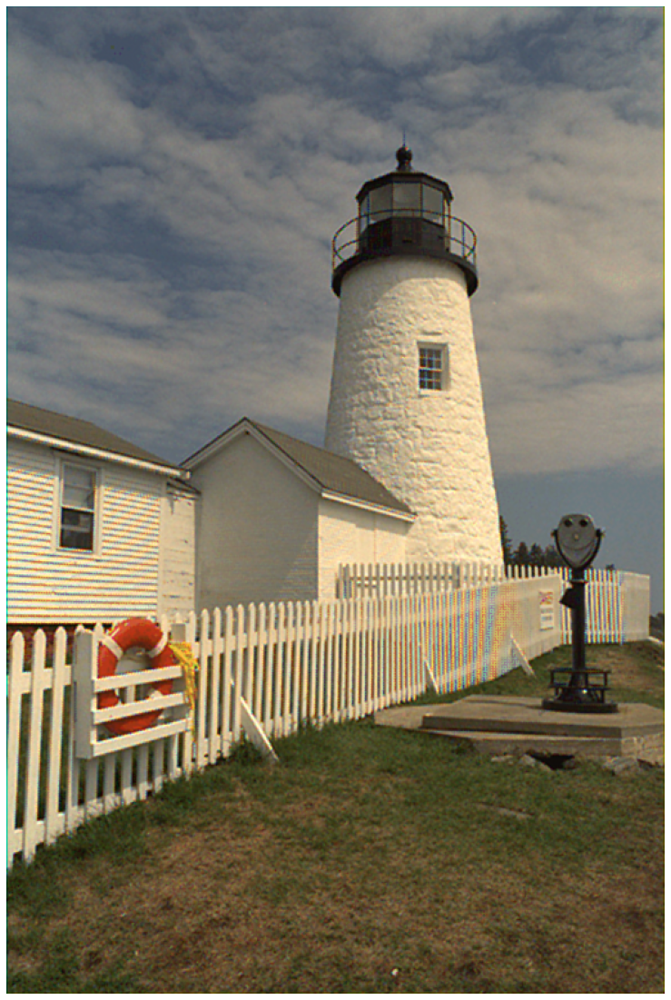

In [8]:
from scipy.interpolate import griddata


# Define a mesh grid for interpolation
x, y = np.meshgrid(np.arange(original.shape[1]), np.arange(original.shape[0]))

# Interpolate for red channel
red_interp = griddata((x[bayer_red != 0], y[bayer_red != 0]), bayer_red[bayer_red != 0], (x, y), method='cubic',fill_value=0)

# Interpolate for blue channel
blue_interp = griddata((x[bayer_blue != 0], y[bayer_blue != 0]), bayer_blue[bayer_blue != 0], (x, y), method='cubic',fill_value=0)

# Interpolate for green channel
green_interp = griddata((x[bayer_green != 0], y[bayer_green != 0]), bayer_green[bayer_green != 0], (x, y), method='cubic',fill_value=0)

# Concatenate interpolated channels
interpolated_image = np.stack((red_interp, green_interp, blue_interp), axis=-1)

plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(interpolated_image,vmin=0,vmax=1)
plt.show()


**Question 6 :** what do you observe?

Answer : Aliazing: The reconstruction is good but for the parts with high frequency (the fence), maybe for sampling issues related to the holes distance.

**Question 7 :** Evaluate the quality of the reconstructed images (using different interpolation methods) using MSE, PSNR and SSIM ([see skimage.metrics](https://scikit-image.org/docs/stable/api/skimage.metrics.html)).



In [9]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

methods=["linear","nearest","cubic"]
# Define a mesh grid for interpolation
x, y = np.meshgrid(np.arange(original.shape[1]), np.arange(original.shape[0]))
interpolated_image=[]
for method in methods:
    red_interp = griddata((x[bayer_red != 0], y[bayer_red != 0]), bayer_red[bayer_red != 0], (x, y), method,fill_value=0)
    blue_interp = griddata((x[bayer_blue != 0], y[bayer_blue != 0]), bayer_blue[bayer_blue != 0], (x, y), method,fill_value=0)
    green_interp = griddata((x[bayer_green != 0], y[bayer_green != 0]), bayer_green[bayer_green != 0], (x, y), method,fill_value=0)
    interpolated_image.append(np.stack((red_interp, green_interp, blue_interp), axis=-1))


In [10]:
for i, method in enumerate(methods):
    print("Method: ",method)
    print("SSIM: ",ssim(original,interpolated_image[i], channel_axis=True, win_size=3, data_range=1))
    print("PSNR: ",psnr(original,interpolated_image[i], data_range=interpolated_image[i].max() - interpolated_image[i].min()))
    print("MSE: ",mse(original,interpolated_image[i]))
    print("---")

#SSIM is highest for the linear method.
#PSNR is highest for the cubic method.
#MSE is  lowest for the cubic method.

#Overall cubic is better

Method:  linear
SSIM:  0.9031348557608636
PSNR:  26.41762400643797
MSE:  0.002281589989805103
---
Method:  nearest
SSIM:  0.8626377612563345
PSNR:  24.075270910955897
MSE:  0.0036118085086256535
---
Method:  cubic
SSIM:  0.8996660001597396
PSNR:  28.304639302272818
MSE:  0.00218582299052799
---


**Image filtering**

**Question 8 :** convert the original RGB astronaut image into grayscale and display the result.

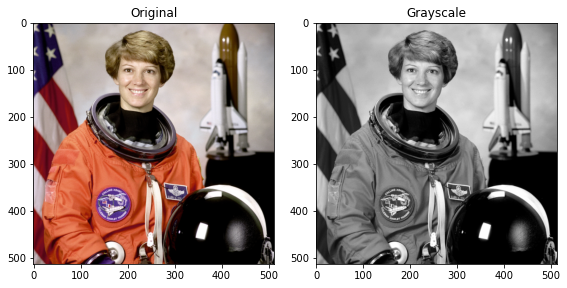

In [16]:
from skimage.color import rgb2gray

epsilon = 1e-6
original = data.astronaut()
grayscale = rgb2gray(original)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
ax = axes.ravel()

ax[0].imshow(original)
ax[0].set_title("Original")
ax[1].imshow(grayscale, cmap=plt.cm.gray)
ax[1].set_title("Grayscale")

fig.tight_layout()
plt.show()


**Question 9 :** using [the convolve function from scipy](https://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.ndimage.filters.convolve.html), define an edge magnitude filtering function, and apply it on the grayscale astronaut image.

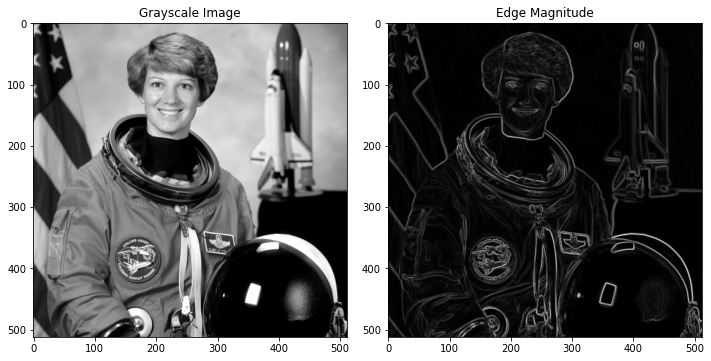

In [70]:
from scipy.ndimage.filters import convolve

import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
from scipy.signal import convolve2d

def edge_magnitude_filter(image):
    # Define Sobel filters
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])

    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])

    # Convolve the image with the Sobel filters
    gradient_x = convolve2d(image, sobel_x, mode='same', boundary='symm')
    gradient_y = convolve2d(image, sobel_y, mode='same', boundary='symm')

    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2) 

    return gradient_magnitude

# Apply the edge magnitude filter to the grayscale image
edge_magnitude = edge_magnitude_filter(grayscale)

# Plot the original grayscale image and the filtered image
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()

ax[0].imshow(grayscale, cmap=plt.cm.gray)
ax[0].set_title("Grayscale Image")

ax[1].imshow(edge_magnitude, cmap=plt.cm.gray)
ax[1].set_title("Edge Magnitude")

plt.tight_layout()
plt.show()


#gradient magnitude is computed as a magnitude as the gradients are vectors in each direction

**Fourier Analysis**

**Question 10:** Compute and visualize the magnitude of the FFT of the grayscale image [using Numpy functions](https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftn.html) (do not forget to shift zero-frequency terms to centre of array).

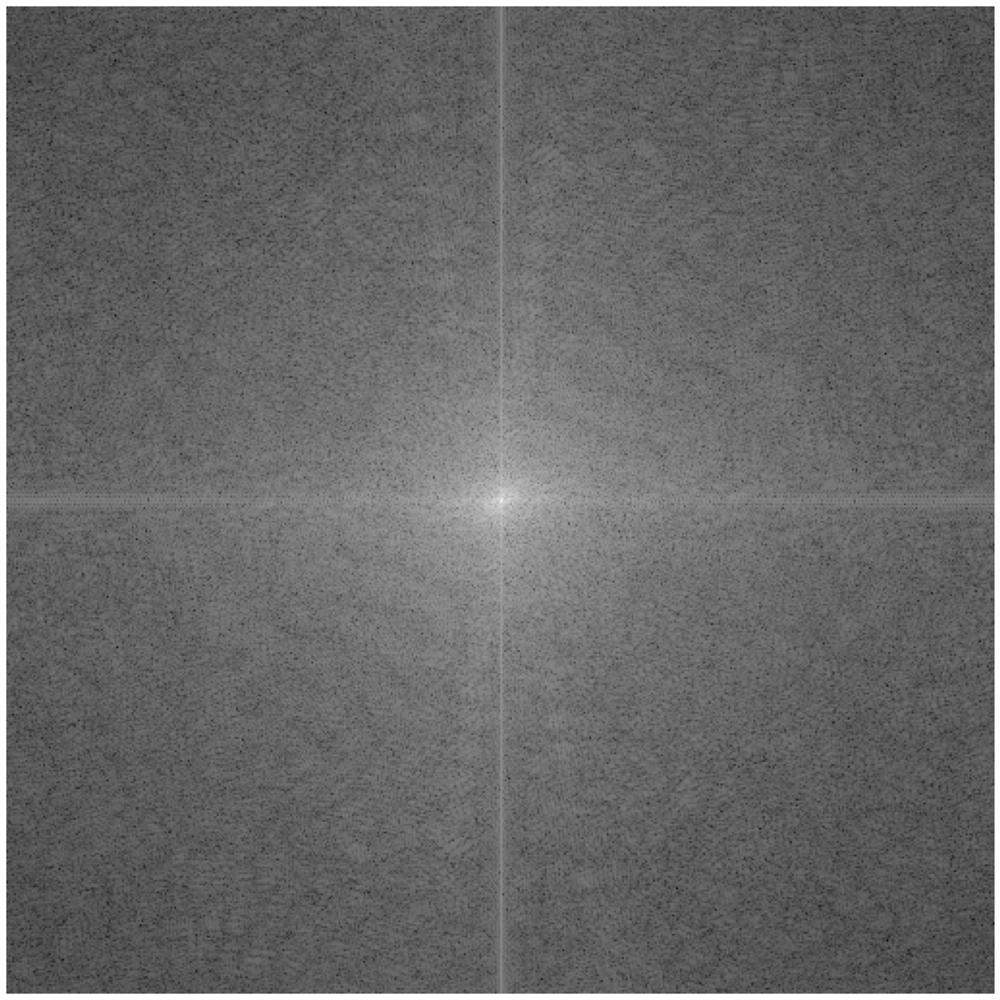

In [71]:
fft_im=np.fft.fftn(grayscale, s=None, axes=None, norm=None)

# Centrar la FFT
fft_im = np.fft.fftshift(fft_im)

# Calcular el espectro de amplitud (la magnitud de la FFT)
fft_im_abs =np.log(np.abs(fft_im))

plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(fft_im_abs,cmap='gray')
plt.show()

**Question 11:** What is the impact of a Gaussian filtering in spatial and frequency domains?

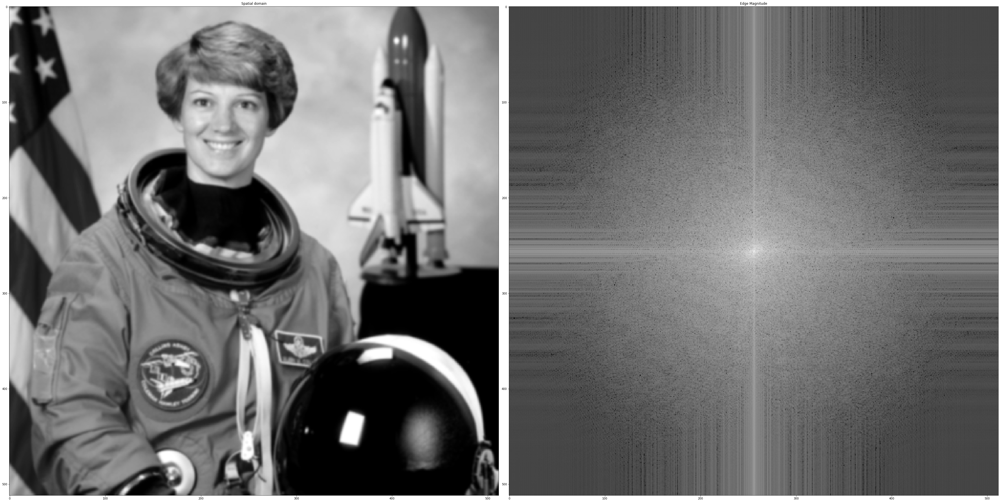

In [72]:
from skimage.filters import gaussian

gaussian_im=gaussian(grayscale)

fft_im_2=np.fft.fftn(gaussian_im, s=None, axes=None, norm=None)

# Centrar la FFT
fft_im_2 = np.fft.fftshift(fft_im_2)

# Calcular el espectro de amplitud (la magnitud de la FFT)
fft_im_2 =np.log(np.abs(fft_im_2))

# Plot the original grayscale image and the filtered image
fig, axes = plt.subplots(1, 2, figsize=(50, 25))
ax = axes.ravel()

ax[0].imshow(gaussian_im, cmap=plt.cm.gray)
ax[0].set_title("Spatial domain")

ax[1].imshow(fft_im_2, cmap=plt.cm.gray)
ax[1].set_title("Edge Magnitude")

plt.tight_layout()
plt.show()
#We can 

**Question 12:** Apply a rotation to the grayscale and display it in the frequency domain. 

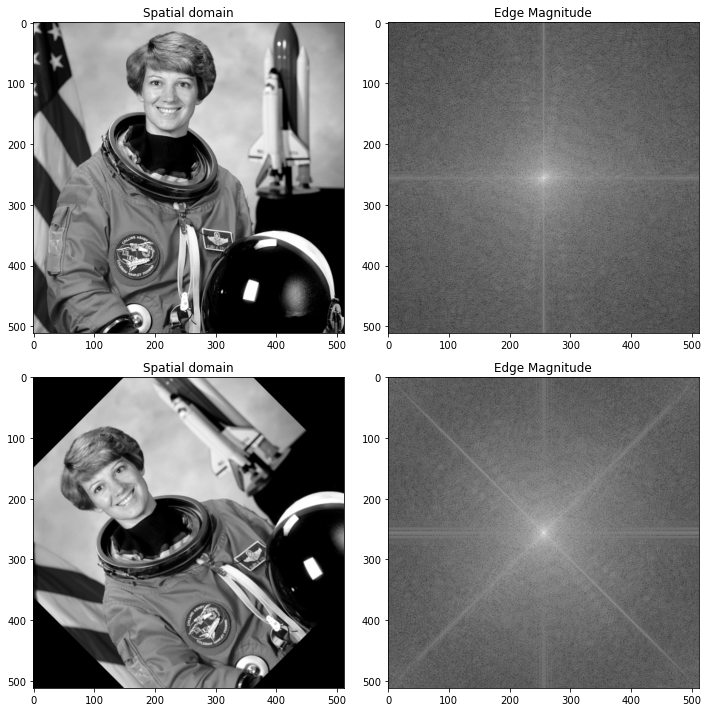

In [81]:
from skimage.transform import rotate

rotated_im= rotate(grayscale, 45)

fft_rot_im=np.fft.fftn(rotated_im, s=None, axes=None, norm=None)

# Centrar la FFT
fft_rot_im = np.fft.fftshift(fft_rot_im)

# Calcular el espectro de amplitud (la magnitud de la FFT)
fft_rot_im =np.log(np.abs(fft_rot_im))

# Plot the original grayscale image and the filtered image
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

ax[0, 0].imshow(grayscale, cmap=plt.cm.gray)
ax[0, 0].set_title("Spatial domain")

ax[0, 1].imshow(fft_im_abs, cmap=plt.cm.gray)
ax[0, 1].set_title("Edge Magnitude")

ax[1, 0].imshow(rotated_im, cmap=plt.cm.gray)
ax[1, 0].set_title("Spatial domain")

ax[1, 1].imshow(fft_rot_im, cmap=plt.cm.gray)
ax[1, 1].set_title("Edge Magnitude")

plt.tight_layout()
plt.show()

#The FFT domain is rotated as well

**Question 13:** Apply a low-pass filter by truncating the spectral data, and display the result in the spatial domain.

In [80]:
from ipywidgets import interact, IntSlider

# Tamaño de la imagen
image_size = np.shape(fft_im)[0]

def update_mask(radius):
    # Crear una matriz de coordenadas
    x, y = np.ogrid[:image_size, :image_size]

    # Calcular las coordenadas del centro de la imagen
    center_x, center_y = image_size / 2, image_size / 2

    # Calcular la distancia de cada píxel al centro de la imagen
    distances = np.sqrt((x - center_x)**2 + (y - center_y)**2)

    # Crear una máscara binaria donde los píxeles dentro del radio estén marcados como 1, y los píxeles fuera como 0
    mask = distances <= radius
    
    # Apply the edge magnitude filter to the grayscale image
    masked_fft_im=fft_im*mask
    masked_fft_im_abs=fft_im_abs*mask
    
    inverse_grayscale=np.fft.ifft2(masked_fft_im)
    inverse_grayscale=np.abs(inverse_grayscale)
    
    # Plot the original grayscale image and the filtered image
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    ax = axes.ravel()

    ax[0].imshow(inverse_grayscale, cmap=plt.cm.gray)
    ax[0].set_title("Grayscale Image")

    ax[1].imshow(masked_fft_im_abs, cmap=plt.cm.gray)
    ax[1].set_title("Edge Magnitude")

    plt.tight_layout()
    plt.show()
    
# Crear un slider interactivo
radius_slider = IntSlider(value=50, min=1, max=100, step=10, description='Radio')

# Vincular el slider con la función update_mask
interact(update_mask, radius=radius_slider)




interactive(children=(IntSlider(value=50, description='Radio', min=1, step=10), Output()), _dom_classes=('widg…

<function __main__.update_mask(radius)>